In [1]:
import numpy as np
import pandas as pd
import bokeh
from bokeh.models import ColumnDataSource
import pyproj
from pyproj import Transformer
from datetime import date,datetime

In [7]:
#Loading twitter data into the python environment

twitter_data = pd.read_csv("D:/Master Project/complete_swiss_dataset.csv",encoding = "ISO-8859-15",low_memory=False)

In [8]:
twitter_data.head()

,Unnamed: 0,user_screen_name,PK,id,latitude,longitude,raw_geo,place_type,place_full_name,place_country_code,...,created_at_CET,created_at_GMT,created_at_EST,check_in_bot,weather_station_bot,Stress.overall.score,homeplace,workplace,cap_english,cap_universal
0,1,________char,938162910789906432_207206008_47.5623099_7.5929...,938162910789906432,47.56231,7.59298,"{u'type': u'Point', u'coordinates': [7.59298, ...",city,"Basel, Switzerland",CH,...,2017-12-05 22:47:22,2017-12-05 21:47:22,2017-12-05 16:47:22,False,False,0,0,0,0.001554,0.002431
1,2,______aki______,916556894617194496_107519313_47.4506607_8.5832...,916556894617194496,47.45066,8.58321,"{u'type': u'Point', u'coordinates': [8.58321, ...",city,"Kloten, Schweiz",CH,...,2017-10-07 08:52:47,2017-10-07 06:52:47,2017-10-07 01:52:47,False,False,0,0,0,0.002857,0.004725
2,3,______pistolero,846853451816583168_1655581028_46.2015699_6.155...,846853451816583168,46.20157,6.15554,"{u'type': u'Point', u'coordinates': [6.15554, ...",city,"Geneva, Switzerland",CH,...,2017-03-29 00:36:11,2017-03-28 22:36:11,2017-03-28 17:36:11,False,False,0,0,0,0.001725,0.002014
3,4,_____FLOW_____,614746843797397504_17493553_47.55831243_7.5876...,614746843797397504,47.55831,7.58769,"{u'type': u'Point', u'coordinates': [7.5876903...",city,"Basel, Switzerland",CH,...,2015-06-27 12:47:23,2015-06-27 10:47:23,2015-06-27 05:47:23,True,False,0,0,0,0.085904,0.104603
4,5,_____helen____,552088809727619072_838437504_46.85314442_9.512...,552088809727619072,46.85314,9.51271,"{u'type': u'Point', u'coordinates': [9.5127096...",city,"Chur, Switzerland",CH,...,2015-01-05 14:06:44,2015-01-05 13:06:44,2015-01-05 08:06:44,False,False,0,0,0,0.125146,0.075193


In [6]:
for i in range(0,len(twitter_data.columns)):
    print(twitter_data.columns[i])

Unnamed: 0
user_screen_name
PK
id
latitude
longitude
raw_geo
place_type
place_full_name
place_country_code
created_at
text
source
retweet_count
favorite_count
is_retweet
is_favorite
is_quote
is_reply
quoted_status_id_permalink
in_reply_to_status_id
in_reply_to_user_id
in_reply_to_screen_name
time_zone
time_zone_utc_offset
user_location
lang
user_id
user_name
user_account_geo_enabled
n_user_mentions
n_hashtags
n_symbols
n_media
n_urls
user_mentions
hashtags
symbols
media
media_types
urls
place_bounding_box_type
place_bounding_box_coords
raw_geo_obj_jic
user_profile_description
user_profile_description_length
user_is_verified
user_total_number_of_tweets_ever
user_followers_count
user_following_count
user_favourited_other_tweets_count
default_profile
user_custom_profile_image
profile_image_url_https
profile_banner_url
profile_background_image_url_https
user_custom_profile_bg_colour
user_custom_profile_bg_colour_hex
user_custom_profile_sidebar_fill_colour
user_custom_profile_sidebar_fill_c

In [5]:
twitter_data['text'][4]

'Heute: Die Endpräsentation von unserer Dosen-Idee vor Igroa, Endemol, @ruedialexander und Isabelle Bentz\r\n#htw_replay http://t.co/kI48hCtqzx'

In [11]:
time_data = twitter_data[
    ['created_at_CET','latitude','longitude','Overall.score','Anger','Confusion',
     'Disgust','Fear','Happiness','Sadness','Shame','Surprise']].sort_values(by='created_at_CET',ignore_index=True)

In [28]:
%%time
time_data.loc[time_data['Overall.score'] > 0].iloc[100]

Wall time: 19 ms


created_at_CET    2015-01-01 09:11:16
latitude                       46.545
longitude                     7.90249
Overall.score                       3
Anger                               0
Confusion                           0
Disgust                             0
Fear                                0
Happiness                           3
Sadness                             0
Shame                               0
Surprise                            0
Name: 666, dtype: object

In [30]:
%%time
time_data

Wall time: 0 ns


,created_at_CET,latitude,longitude,Overall.score,Anger,Confusion,Disgust,Fear,Happiness,Sadness,Shame,Surprise
0,2015-01-01 01:00:03,47.458056,8.548056,0,0,0,0,0,0,0,0,0
1,2015-01-01 01:00:09,46.160107,8.777331,0,0,0,0,0,0,0,0,0
2,2015-01-01 01:00:14,46.359543,6.928623,3,0,0,0,0,3,0,0,0
3,2015-01-01 01:00:22,46.382500,6.242180,0,0,0,0,0,0,0,0,0
4,2015-01-01 01:00:34,46.160107,8.777331,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1115888,2018-09-06 16:51:13,46.798560,8.231973,0,0,0,0,0,0,0,0,0
1115889,2018-09-06 16:53:31,46.200280,6.145556,0,0,0,0,0,0,0,0,0
1115890,2018-09-06 16:53:53,46.230510,6.103398,0,0,0,0,0,0,0,0,0
1115891,2018-09-06 16:54:32,47.050000,7.283330,0,0,0,0,0,0,0,0,0


In [31]:
twitter_data['created_at_CET'][921301]

'2015-01-01 01:00:14'

In [32]:
twitter_data[['latitude','longitude']].head()

,latitude,longitude
0,47.56231,7.59298
1,47.45066,8.58321
2,46.20157,6.15554
3,47.55831,7.58769
4,46.85314,9.51271


In [34]:
coord_data = twitter_data[['latitude','longitude']]
coord_data = coord_data.round(3)

In [35]:
coord_data.head()

,latitude,longitude
0,47.562,7.593
1,47.451,8.583
2,46.202,6.156
3,47.558,7.588
4,46.853,9.513


In [36]:
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

In [38]:
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import CARTODBPOSITRON, OSM, get_provider

output_file("tile.html")

tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator", plot_width=1000)
p.add_tile(tile_provider)

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

merc_coord = transformer.transform(coord_data['latitude'].values,
                            coord_data['longitude'].values)

source = ColumnDataSource(data=dict(longitude=merc_coord[0], latitude=merc_coord[1]))

p.circle(x='longitude', y='latitude', size=1, color="black", alpha=0.7, source=source)

#show(p)

GlyphRenderer(id='1246', ...)

In [14]:
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import CARTODBPOSITRON, OSM, get_provider

output_file("tile.html")

tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator",
           plot_width=1000)
p.add_tile(tile_provider)

transformer = Transformer.from_crs("epsg:4326", "EPSG:3857")

coord_data_no_dup = coord_data.drop_duplicates()

merc_coord_no_dup = transformer.transform(coord_data_no_dup['latitude'].values,
                                   coord_data_no_dup['longitude'].values)

source = ColumnDataSource(data=dict(longitude=merc_coord_no_dup[0], latitude=merc_coord_no_dup[1]))

p.circle(x='longitude', y='latitude', size=1, color="black", alpha=0.7, source=source)

show(p)

In [15]:
CH = ((6,  11), (45.5, 48))

from datashader.utils import lnglat_to_meters as webm
x_range,y_range = [list(r) for r in webm(*CH)]

plot_width  = int(3096)
plot_height = int(plot_width*7.0/12)

C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\datashader\spatial\__init__.py:17: VisibleDeprecationWarning: The datashader.spatial module is deprecated as of version 0.11.0. The functionality it provided has migrated to the spatialpandas (github.com/holoviz/spatialpandas) and xarray-spatial (github.com/makepath/xarray-spatial) libraries.
  warnings.warn(


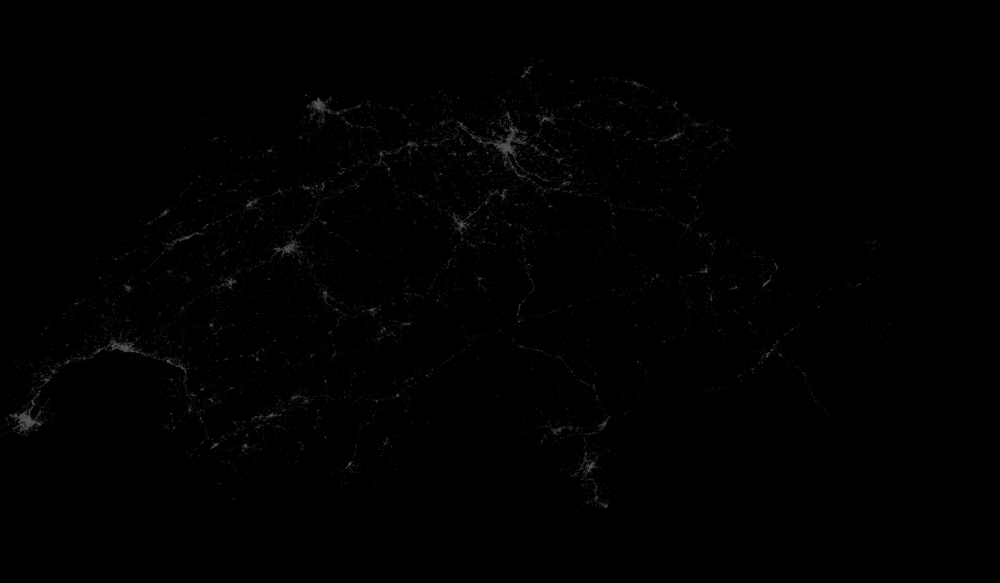

In [16]:
import datashader as ds, datashader.transfer_functions as tf, numpy as np
from datashader import spatial

background = "black"

from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9
from IPython.core.display import HTML, display

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

cvs = ds.Canvas(plot_width, plot_height, *webm(*CH))

#Formatting merc_coord for datashader
merc_coord_ds = pd.DataFrame(np.array(merc_coord).T)
merc_coord_ds.columns = ['latitude','longitude']


agg = cvs.points(merc_coord_ds, 'latitude', 'longitude')
export(tf.shade(agg, cmap = cm(Greys9,0.25), how='linear'),"census_gray_linear")

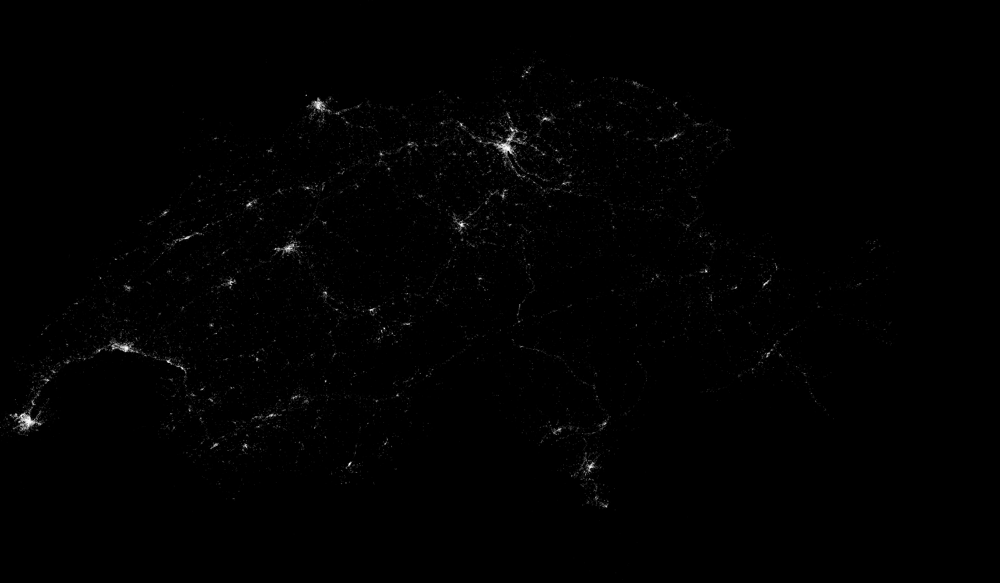

In [17]:
export(tf.shade(agg, cmap = cm(Greys9,0.2), how='eq_hist'),"census_gray_eq_hist")

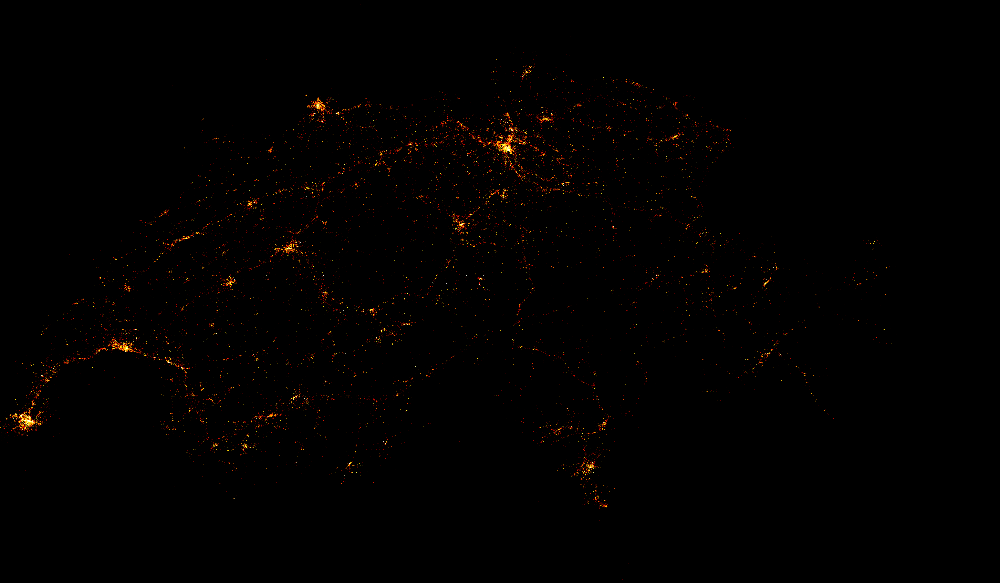

In [18]:
from colorcet import fire
export(tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist'),"census_ds_fire_eq_hist")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
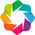

In [19]:
import holoviews as hv, geoviews as gv, geoviews.tile_sources as gts
from holoviews.operation.datashader import datashade, dynspread
from holoviews import opts
hv.extension('bokeh')

opts.defaults(
    opts.Overlay(width=900, height=525, xaxis=None, yaxis=None))

In [20]:
points = hv.Points(gv.Dataset(merc_coord_ds, kdims=['latitude', 'longitude']))

In [21]:
population = dynspread(datashade(points, cmap=fire, element_type=gv.Image))

In [22]:
population = dynspread(datashade(points, cmap=fire, element_type=gv.Image))
gts.EsriImagery() * population

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [latitude,longitude]   (R,G,B,A)

In [4]:
import yaml

from bokeh.layouts import column, row
from bokeh.models import ColumnDataSource, Slider, Button, TextInput, DateRangeSlider, DatePicker
from bokeh.plotting import figure
from bokeh.themes import Theme
from bokeh.io import show, output_notebook
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import CARTODBPOSITRON, OSM, get_provider

output_notebook()

Loading BokehJS ...

In [39]:
dev_coord_data_time = twitter_data[['latitude','longitude','created_at_CET']]
dev_coord_data_time = dev_coord_data_time.round(3)

In [25]:
dev_coord_data_time.loc[:,'ID'] = dev_coord_data_time.index

In [26]:
dev_coord_data_time = dev_coord_data_time.set_index(['created_at_CET'])

In [62]:
dev_coord_data_time

,latitude,longitude,ID
created_at_CET,,,
2015-01-01 01:00:03,47.458,8.548,577072
2015-01-01 01:00:09,46.160,8.777,372682
2015-01-01 01:00:14,46.360,6.929,921301
2015-01-01 01:00:22,46.382,6.242,151568
2015-01-01 01:00:34,46.160,8.777,372724
...,...,...,...
2018-09-06 16:51:13,46.799,8.232,118483
2018-09-06 16:53:31,46.200,6.146,238174
2018-09-06 16:53:53,46.231,6.103,570773


In [59]:
dev_coord_data_time['created_at_CET'] = pd.to_datetime(dev_coord_data_time['created_at_CET'],
                                                       format='%Y-%m-%d %H:%M:%S')

KeyError: 'created_at_CET'

In [ ]:
dev_22 = dev_coord_data_time.sort_values(by='created_at_CET')

In [ ]:
dev_coord_data_time.query

In [61]:
dev_coord_data_time.index = pd.to_datetime(dev_coord_data_time.index, format='%Y-%m-%d %H:%M:%S')

In [30]:
dev_coord_data_time = dev_coord_data_time.sort_index()

In [94]:
def bkapp(doc):

    tile_provider = get_provider(CARTODBPOSITRON)

    # range bounds supplied in web mercator coordinates
    p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
               x_axis_type="mercator", y_axis_type="mercator")
    p.add_tile(tile_provider)

    transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

    dev_merc_coord = transformer.transform(dev_coord_data_time['latitude']['2015-1-1':'2015-2-1'].values,
                                dev_coord_data_time['longitude']['2015-1-1':'2015-2-1'].values)

    source = ColumnDataSource(data=dict(longitude=dev_merc_coord[0], latitude=dev_merc_coord[1]))

    p.circle(x='longitude', y='latitude', size=1, color="black", alpha=0.7, source=source)
    
    def callback(attr, old, new):
        
        start_date = date.fromtimestamp(new[0]/1000)
        
        end_date = date.fromtimestamp(new[1]/1000)
        
        dev_merc_coord = transformer.transform(dev_coord_data_time['latitude'][start_date:end_date].values,
                                               dev_coord_data_time['longitude'][start_date:end_date].values)
        
        source.data = dict(longitude=dev_merc_coord[0], latitude=dev_merc_coord[1])
        

    date_slider = DateRangeSlider(title="Date Range: ", start=date(2015, 1, 1),
                                 end=date(2018,9,6), value=(date(2015, 1, 1), date(2015, 12, 31)), step=1)
    
    date_slider.on_change('value', callback)
    
    def my_button_handler(new):
        
        start_date = start_date_input.value
        
        end_date = end_date_input.value
        
        dev_merc_coord = transformer.transform(dev_coord_data_time['latitude'][start_date:end_date].values,
                                               dev_coord_data_time['longitude'][start_date:end_date].values)
        
        source.data = dict(longitude=dev_merc_coord[0], latitude=dev_merc_coord[1])

    button = Button(label="Update", button_type="success")

    button.on_click(my_button_handler)
    
    start_date_input = DatePicker(value="2015-01-01", title="Start Date:")
    
    end_date_input = DatePicker(value="2015-02-01", title="End Date:")

    doc.add_root(row(column(p),column(start_date_input,end_date_input,button)))

In [95]:
show(bkapp)

tornado.application - ERROR - Uncaught exception GET /autoload.js?bokeh-autoload-element=2773&bokeh-absolute-url=http://localhost:51845&resources=none (127.0.0.1)
HTTPServerRequest(protocol='http', host='localhost:51845', method='GET', uri='/autoload.js?bokeh-autoload-element=2773&bokeh-absolute-url=http://localhost:51845&resources=none', version='HTTP/1.1', remote_ip='127.0.0.1')
Traceback (most recent call last):
  File "C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\tornado\web.py", line 1703, in _execute
    result = await result
  File "C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\bokeh\server\views\autoload_js_handler.py", line 60, in get
    session = await self.get_session()
  File "C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\bokeh\server\views\session_handler.py", line 120, in get_session
    session = await self.application_context.create_session_if_needed(session_id, self.request, token)
  File "C:\Users\Laptop\Anaconda

In [33]:
%%time
dev_coord_data_time['2015-1-1':'2015-7-1']

Wall time: 0 ns


,latitude,longitude,ID
created_at_CET,,,
2015-01-01 01:00:03,47.458,8.548,577072
2015-01-01 01:00:09,46.160,8.777,372682
2015-01-01 01:00:14,46.360,6.929,921301
2015-01-01 01:00:22,46.382,6.242,151568
2015-01-01 01:00:34,46.160,8.777,372724
...,...,...,...
2015-07-01 23:50:31,46.509,6.681,549292
2015-07-01 23:51:43,47.567,7.600,62639
2015-07-01 23:52:54,46.000,8.950,627789


In [34]:
%%time
dev_coord_data_time[0:339876]

Wall time: 0 ns


,latitude,longitude,ID
created_at_CET,,,
2015-01-01 01:00:03,47.458,8.548,577072
2015-01-01 01:00:09,46.160,8.777,372682
2015-01-01 01:00:14,46.360,6.929,921301
2015-01-01 01:00:22,46.382,6.242,151568
2015-01-01 01:00:34,46.160,8.777,372724
...,...,...,...
2015-07-01 23:50:31,46.509,6.681,549292
2015-07-01 23:51:43,47.567,7.600,62639
2015-07-01 23:52:54,46.000,8.950,627789


In [35]:
%%time

UsageError: %%time is a cell magic, but the cell body is empty. Did you mean the line magic %time (single %)?


In [36]:
date = dev_coord_data_time.index[0]

In [37]:
date.year

2015

In [38]:
year = 0
month = 0
day = 0

In [39]:
if(date.year != year):
    Buckets.append([])
    i += 1
    

NameError: name 'Buckets' is not defined

In [40]:
%%time
dev_coord_data_time['2015-2-1':'2016-2-1']

Wall time: 0 ns


,latitude,longitude,ID
created_at_CET,,,
2015-02-01 00:00:04,47.447,8.529,241648
2015-02-01 00:00:04,47.458,8.548,577279
2015-02-01 00:00:12,47.447,8.529,241657
2015-02-01 00:00:14,47.447,8.529,241655
2015-02-01 00:00:19,47.447,8.529,241697
...,...,...,...
2016-02-01 23:36:28,46.485,9.820,53562
2016-02-01 23:36:31,46.498,7.337,66629
2016-02-01 23:40:53,47.364,8.545,357286


In [41]:
%%time
dev_merc_coord = transformer.transform(dev_coord_data_time['latitude']['2015-1-1':'2019-2-1'].values,
                                       dev_coord_data_time['longitude']['2015-1-1':'2019-2-1'].values)

Wall time: 401 ms


In [ ]:
dev_coord_data_time.drop_duplicates(subset=['latitude','longitude'])

In [ ]:
%%time
dev_coord_data_time.duplicated(subset=['latitude','longitude'])

In [120]:
dev_coord_density = dev_coord_data_time

In [121]:
dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

In [125]:
dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

In [126]:
dev_coord_density

,latitude,longitude,ID
0,25.347,49.584,751151
1,26.641,49.916,320602
2,27.007,49.655,2606
3,27.115,49.551,835046
4,29.331,48.064,58256
...,...,...,...
1115888,55.731,37.453,400855
1115889,55.949,-3.363,131836
1115890,56.954,24.137,70051
1115891,59.940,30.285,911081


In [127]:
dev_coord_density_no_dup = dev_coord_density.drop_duplicates(subset=['latitude','longitude'])

In [128]:
%%time
density = np.ones(len(dev_coord_density_no_dup))
for i in range(0,len(dev_coord_density_no_dup)-1):
    density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

Wall time: 278 ms


In [129]:
dev_coord_density_no_dup.loc[:,'density'] = density

C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\pandas\core\indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [130]:
dev_coord_density_no_dup[0:10]

,latitude,longitude,ID,density
0,25.347,49.584,751151,1.0
1,26.641,49.916,320602,1.0
2,27.007,49.655,2606,1.0
3,27.115,49.551,835046,1.0
4,29.331,48.064,58256,1.0
5,30.588,18.407,147020,1.0
6,32.007,34.800,742677,1.0
7,32.080,20.105,248901,10.0
17,32.114,20.068,248896,2.0
19,32.147,20.131,860787,1.0


In [131]:
dev_coord_data_time.loc['2015-1-1':'2015-2-1']

,latitude,longitude,ID
created_at_CET,,,
2015-01-01 01:00:03,47.458,8.548,577072
2015-01-01 01:00:09,46.160,8.777,372682
2015-01-01 01:00:14,46.360,6.929,921301
2015-01-01 01:00:22,46.382,6.242,151568
2015-01-01 01:00:34,46.160,8.777,372724
...,...,...,...
2015-02-01 23:57:37,46.511,6.637,145083
2015-02-01 23:58:07,47.552,7.619,1094076
2015-02-01 23:58:34,47.368,8.540,1104107


In [105]:
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import CARTODBPOSITRON, OSM, get_provider

output_file("tile.html")

tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator",
           plot_width=1000)
p.add_tile(tile_provider)

transformer = Transformer.from_crs("epsg:4326", "EPSG:3857")

merc_coord_no_dup = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                   dev_coord_density_no_dup['longitude'].values)

source = ColumnDataSource(data=dict(longitude=merc_coord_no_dup[0], latitude=merc_coord_no_dup[1], color=density))

p.circle(x='longitude', y='latitude', size=1, color='color', alpha=0.7, source=source)

show(p)

In [106]:
from bokeh.models import CategoricalColorMapper
from bokeh.palettes import Spectral6
from bokeh.transform import linear_cmap, log_cmap
from bokeh.palettes import PRGn, Turbo256
palette = Turbo256
from bokeh.models import ColorBar, NumeralTickFormatter, Circle
from bokeh.models import LassoSelectTool, BoxSelectTool

In [278]:
def dev_bkapp(doc):

    tile_provider = get_provider(CARTODBPOSITRON)

    # range bounds supplied in web mercator coordinates
    geo_map = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
               x_axis_type="mercator", y_axis_type="mercator")
    geo_map.add_tile(tile_provider)
    geo_map.add_tools(LassoSelectTool())
    geo_map.add_tools(BoxSelectTool())

    transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")
    
    dev_coord_density = dev_coord_data_time.loc['2015-1-1':'2015-2-1'].copy()
        
    dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

    dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

    dev_coord_density_no_dup = dev_coord_density.drop_duplicates(subset=['latitude','longitude'])

    density = np.ones(len(dev_coord_density_no_dup))

    for i in range(0,len(dev_coord_density_no_dup)-1):
        density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

    dev_coord_density_no_dup.loc[:,'density'] = density

    dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                           dev_coord_density_no_dup['longitude'].values)
    
    plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
    plot_data.columns = ['longitude','latitude']

    plot_data.loc[:,'density'] = density

    source = ColumnDataSource(plot_data)

    color_mapper = log_cmap(field_name = 'density', palette = palette,
                               low = plot_data.loc[:,'density'].min(), high = plot_data.loc[:,'density'].max())

    #Defines color bar
    color_bar = ColorBar(color_mapper=color_mapper['transform'], 
                         formatter = NumeralTickFormatter(format='0.0[0000]'), 
                         label_standoff = 13, width=8, location=(0,0))# Set color_bar location

    geo_map.add_layout(color_bar, 'right')
    
    geo_map.circle(x='longitude', y='latitude', size=2, alpha=0.7, source=source, color=color_mapper)
    
    def my_button_handler(new):
        
        start_date = start_date_input.value
        
        end_date = end_date_input.value
        
        dev_coord_density = dev_coord_data_time.loc[start_date:end_date].copy()
        
        dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])
        
        dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))
        
        dev_coord_density_no_dup = dev_coord_density.drop_duplicates(subset=['latitude','longitude'])
        
        density = np.ones(len(dev_coord_density_no_dup))
        
        for i in range(0,len(dev_coord_density_no_dup)-1):
            density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]
        
        dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                               dev_coord_density_no_dup['longitude'].values)
        
        plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
        plot_data.columns = ['longitude','latitude']

        plot_data.loc[:,'density'] = density

        color_mapper = log_cmap(field_name = 'density', palette = palette,
                                   low = plot_data.loc[:,'density'].min(), high = plot_data.loc[:,'density'].max())
        
        color_bar.color_mapper=color_mapper['transform']
        
        source.data = plot_data

    button = Button(label="Update", button_type="success")

    button.on_click(my_button_handler)
    
    dev_button = Button(label="Print", button_type="success")

    def temp():
        selected = source.selected.indices
        
        hist.data['x'] = selected
        
        print(selected)
        
        print(plot_data[selected[0]])
    
    dev_button.on_click(temp)
    
    start_date_input = DatePicker(value="2015-01-01", title="Start Date:")
    
    end_date_input = DatePicker(value="2015-02-01", title="End Date:")

    histogram = figure()
    
    hist = ColumnDataSource(data=dict(x=[0,1,2,3,4,5]))
    
    histogram.circle(x='x', size=10, alpha=0.7, source=hist)
    
    doc.add_root(row(column(geo_map,row(start_date_input,end_date_input),row(button)),column(histogram,dev_button)))

In [279]:
show(dev_bkapp)

bokeh.server.protocol_handler - ERROR - error handling message
 message: Message 'PATCH-DOC' content: {'events': [{'kind': 'MessageSent', 'msg_type': 'bokeh_event', 'msg_data': {'event_name': 'button_click', 'event_values': {}}}], 'references': []} 
 error: KeyError(8073)
Traceback (most recent call last):
  File "C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\pandas\core\indexes\base.py", line 2646, in get_loc
    return self._engine.get_loc(key)
  File "pandas\_libs\index.pyx", line 111, in pandas._libs.index.IndexEngine.get_loc
  File "pandas\_libs\index.pyx", line 138, in pandas._libs.index.IndexEngine.get_loc
  File "pandas\_libs\hashtable_class_helper.pxi", line 1619, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas\_libs\hashtable_class_helper.pxi", line 1627, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 8073

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Us

[8073]


C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\bokeh\server\protocol_handler.py:94: RuntimeWarning: coroutine 'WSHandler.send_message' was never awaited
  work = connection.error(message, repr(e))


In [297]:
dev_coord_density[0:15]

,latitude,longitude,ID
0,27.007,49.655,2606
1,40.262,-3.917,216481
2,40.309,23.206,1115309
3,40.314,-3.923,229443
4,40.539,-3.896,456821
5,43.665,4.121,570426
6,45.175,5.718,482825
7,45.176,5.719,482835
8,45.176,5.719,482832
9,45.176,5.719,482826


In [293]:
dev_coord_density_no_dup = dev_coord_density.drop_duplicates(subset=['latitude','longitude'])

density = np.ones(len(dev_coord_density_no_dup))

for i in range(0,len(dev_coord_density_no_dup)-1):
    density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

In [113]:
tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p_1 = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator")
p_1.add_tile(tile_provider)

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")
    
dev_coord_density = dev_coord_data_time['2015-1-1':'2015-2-1']

dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

dev_coord_density_no_dup = dev_coord_density.drop_duplicates()

density = np.ones(len(dev_coord_density_no_dup))

for i in range(0,len(dev_coord_density_no_dup)-1):
    density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                       dev_coord_density_no_dup['longitude'].values)

plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
plot_data.columns = ['longitude','latitude']

plot_data.loc[:,'density'] = density

source = ColumnDataSource(plot_data)

color_mapper = log_cmap(field_name = 'density', palette = palette,
                           low = plot_data['density'].min(), high = plot_data['density'].max())

#Defines color bar
color_bar = ColorBar(color_mapper=color_mapper['transform'], 
                     formatter = NumeralTickFormatter(format='0.0[0000]'), 
                     label_standoff = 13, width=8, location=(0,0))# Set color_bar location

p_1.add_layout(color_bar, 'right')


glyph = Circle(x='longitude', y='latitude', size=3, alpha=0.7, source=source, color=color_mapper)
p_1.add_glyph(source, glyph)

show(p_1)

NameError: name 'glyph' is not defined

In [285]:
dev_coord_density['ID']

0           2606
1         216481
2        1115309
3         229443
4         456821
          ...   
89893     515442
89894     745536
89895     844982
89896     246774
89897    1021278
Name: ID, Length: 89898, dtype: int64

In [83]:
plot_data.iloc[3787]

longitude    6.796055e+05
latitude     5.804259e+06
density      1.000000e+00
Name: 3787, dtype: float64

In [84]:
plot_data['density'].sort_values()

0        1.0
59935    1.0
59934    1.0
59933    1.0
59932    1.0
        ... 
29963    1.0
29962    1.0
29961    1.0
29969    1.0
89897    1.0
Name: density, Length: 89898, dtype: float64

In [85]:
plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
plot_data.columns = ['longitude','latitude']

In [86]:
plot_data.loc[:,'density'] = density

In [87]:
plot_data['density']

0        1.0
1        1.0
2        1.0
3        1.0
4        1.0
        ... 
89893    1.0
89894    1.0
89895    1.0
89896    1.0
89897    1.0
Name: density, Length: 89898, dtype: float64

In [134]:
dev_coord_data_time.loc['2015-1-1':'2015-1-3']

,latitude,longitude,ID
created_at_CET,,,
2015-01-01 01:00:03,47.458,8.548,577072
2015-01-01 01:00:09,46.160,8.777,372682
2015-01-01 01:00:14,46.360,6.929,921301
2015-01-01 01:00:22,46.382,6.242,151568
2015-01-01 01:00:34,46.160,8.777,372724
...,...,...,...
2015-01-03 23:59:44,46.207,6.130,275553
2015-01-03 23:59:46,47.416,8.528,874254
2015-01-03 23:59:52,46.221,6.129,399000


In [88]:
from bokeh.models import Circle

In [114]:
tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator")
p.add_tile(tile_provider)

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

dev_coord_density = dev_coord_data_time.loc['2015-1-1':'2015-2-1']

dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

dev_coord_density_no_dup = dev_coord_density.drop_duplicates()



In [115]:
density = np.ones(len(dev_coord_density_no_dup))

for i in range(0,len(dev_coord_density_no_dup)-1):
    density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

dev_coord_density_no_dup.loc[:,'density'] = density

dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                       dev_coord_density_no_dup['longitude'].values)

plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
plot_data.columns = ['longitude','latitude']

plot_data.loc[:,'density'] = density

source = ColumnDataSource(plot_data)

color_mapper = log_cmap(field_name = 'density', palette = palette,
                           low = plot_data['density'].min(), high = plot_data['density'].max())

#Defines color bar
color_bar = ColorBar(color_mapper=color_mapper['transform'], 
                     formatter = NumeralTickFormatter(format='0.0[0000]'), 
                     label_standoff = 13, width=8, location=(0,0))# Set color_bar location

p.add_layout(color_bar, 'right')

p.circle(x='longitude', y='latitude', size=2, alpha=0.7, source=source, color=color_mapper)

show(p)

In [242]:
dev_merc_coord

(array([ 5527569.31534   ,  -436038.44543725,  2583280.10334871, ...,
         -321490.68941097,  -703316.5428319 , -2449585.39490598]),
 array([3124346.33382555, 4904088.76954935, 4910947.44418863, ...,
        7063309.45012915, 7260250.6861715 , 9388978.96579788]))

In [241]:
plot_data

,longitude,latitude,density
0,5.527569e+06,3.124346e+06,1.0
1,-4.360384e+05,4.904089e+06,1.0
2,2.583280e+06,4.910947e+06,1.0
3,-4.367064e+05,4.911677e+06,1.0
4,-4.337007e+05,4.944580e+06,1.0
...,...,...,...
89893,1.489010e+06,6.892139e+06,1.0
89894,-1.374796e+05,6.939831e+06,1.0
89895,-3.214907e+05,7.063309e+06,1.0
89896,-7.033165e+05,7.260251e+06,1.0


In [117]:
tile_provider = get_provider(CARTODBPOSITRON)

# range bounds supplied in web mercator coordinates
p = figure(x_range=(650000, 1200000), y_range=(5700000, 6100000),
           x_axis_type="mercator", y_axis_type="mercator")
p.add_tile(tile_provider)
p.add_tools(LassoSelectTool())
p.add_tools(BoxSelectTool())

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

dev_coord_density = dev_coord_data_time.loc['2015-1-1':'2015-2-1']

dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

dev_coord_density_no_dup = dev_coord_density.drop_duplicates(subset=['latitude','longitude'])

density = np.ones(len(dev_coord_density_no_dup))

for i in range(0,len(dev_coord_density_no_dup)-1):
    density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

dev_coord_density_no_dup.loc[:,'density'] = density

dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                       dev_coord_density_no_dup['longitude'].values)

plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
plot_data.columns = ['longitude','latitude']

plot_data.loc[:,'density'] = density

source = ColumnDataSource(plot_data)

color_mapper = log_cmap(field_name = 'density', palette = palette,
                           low = plot_data['density'].min(), high = plot_data['density'].max())

#Defines color bar
color_bar = ColorBar(color_mapper=color_mapper['transform'], 
                     formatter = NumeralTickFormatter(format='0.0[0000]'), 
                     label_standoff = 13, width=8, location=(0,0))# Set color_bar location

p.add_layout(color_bar, 'right')

p.circle(x='longitude', y='latitude', size=2, alpha=0.7, source=source, color=color_mapper)

def my_button_handler(new):

    start_date = start_date_input.value

    end_date = end_date_input.value

    dev_coord_density = dev_coord_data_time.loc[start_date:end_date]

    dev_coord_density = dev_coord_density.sort_values(by=['latitude','longitude'])

    dev_coord_density = dev_coord_density.set_index(np.arange(0,len(dev_coord_density),1))

    dev_coord_density_no_dup = dev_coord_density.drop_duplicates()

    density = np.ones(len(dev_coord_density_no_dup))

    for i in range(0,len(dev_coord_density_no_dup)-1):
        density[i] = dev_coord_density_no_dup.index[i+1] - dev_coord_density_no_dup.index[i]

    dev_coord_density_no_dup.loc[:,'density'] = density

    dev_merc_coord = transformer.transform(dev_coord_density_no_dup['latitude'].values,
                                           dev_coord_density_no_dup['longitude'].values)

    plot_data = pd.DataFrame(np.array(dev_merc_coord).T)
    plot_data.columns = ['longitude','latitude']

    plot_data.loc[:,'density'] = density

    color_mapper = log_cmap(field_name = 'density', palette = palette,
                               low = plot_data['density'].min(), high = plot_data['density'].max())

    color_bar.color_mapper=color_mapper['transform']

    source.data = plot_data

button = Button(label="Update", button_type="success")

button.on_click(my_button_handler)

start_date_input = DatePicker(value="2015-01-01", title="Start Date:")

end_date_input = DatePicker(value="2015-02-01", title="End Date:")

show(p)

In [202]:
plot_data.loc[:,'density'].min()

1.0

In [209]:
color_mapper = log_cmap(field_name = 'density', palette = palette,
                                   low = plot_data.loc[:,'density'].min(), high = plot_data.loc[:,'density'].max())
        
color_bar.color_mapper=color_mapper['transform']

In [214]:
color_mapper['transform']

LogColorMapper(id='8604', ...)

C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\pandas\core\indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\Laptop\Anaconda3\envs\Master Project\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [221]:
pd.options.mode.chained_assignment = None  # default='warn'